In [2]:
#Importing packages
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns
import matplotlib.gridspec as gridspec
import plotly.graph_objs as go
import plotly.express as px
from plotly.subplots import make_subplots

In [3]:
#Reading the dataset
bb=pd.read_csv("basketball.csv")

In [4]:
bb.isnull().sum() #checking for NULL values

League                            0
Season                            0
Stage                             0
Player                            0
Team                             11
Games Played (GP)                 0
Minutes Played (MIN)              0
Field Goals Made (FGM)            0
Field Goals Attempts (FGA)        0
Three Points Made (3PM)           0
Three Points Attemps (3PA)        0
Free Throws Made (FTM)            0
Free Throws Attempts (FTA)        0
Turnovers (TOV)                   0
Personal Fouls (PF)               0
Offensive Rebounds (ORB)          0
Defensive Rebounds (DRB)          0
Rebounds (REB)                    0
Assissts (AST)                    0
Steals (STL)                      0
Blocks (BLK)                      0
Points (PTS)                      0
birth_year                      319
birth_month                     319
birth_date                      319
height                           74
height_cm                        74
weight                      

In [5]:
bb.drop(['height','weight','high_school','birth_month','birth_date'],axis=1, inplace=True)  #dropping columns 

In [6]:
print('Shape:',bb.shape)

Shape: (53798, 26)


In [7]:
bool_series = pd.isnull(bb["nationality"])  #displaying only rows having missing values
bb[bool_series]

,League,Season,Stage,Player,Team,Games Played (GP),Minutes Played (MIN),Field Goals Made (FGM),Field Goals Attempts (FGA),Three Points Made (3PM),...,Defensive Rebounds (DRB),Rebounds (REB),Assissts (AST),Steals (STL),Blocks (BLK),Points (PTS),birth_year,height_cm,weight_kg,nationality
4106,Australian-NBL,2003 - 2004,International,John Thomas,GIE,23,805.8,118,269,37,...,42,66,88,24,1,426,1976.0,175.0,NaN,NaN
4144,German-BBL,2003 - 2004,International,John Thomas,GIE,23,805.8,118,269,37,...,42,66,88,24,1,426,1976.0,175.0,NaN,NaN
16669,Belarusian-BPL,2019 - 2020,International,Sergey Sapegin,RUB,19,207.6,16,54,6,...,19,24,31,16,3,48,1984.0,193.0,NaN,NaN
23747,Austrian-A-Bundesliga,2014 - 2015,International,Nolan Richardson,GRZ,33,1015.3,132,317,73,...,65,80,79,31,1,391,1986.0,188.0,82.0,NaN
26405,Romanian-Divizia-A,2016 - 2017,International,Andrei Dohi,BAIA,15,249.8,40,79,11,...,28,46,10,8,5,106,1987.0,208.0,NaN,NaN
52889,Belarusian-BPL,2015 - 2016,International,Nikita C,SOZ,21,358.2,36,113,4,...,45,65,29,22,3,80,1999.0,NaN,NaN,NaN
53531,Lebanese-Division-A,2019 - 2020,International,Jaylin Johnson,BYB,4,92.2,16,42,5,...,11,11,5,3,2,52,NaN,NaN,NaN,NaN


In [8]:
bb = bb[bb.isnull().sum(axis=1) < 3]     #removes rows with more than 2 missing values

In [9]:
print('Shape:',bb.shape)

Shape: (53750, 26)


In [10]:
bb.isnull().sum()

League                           0
Season                           0
Stage                            0
Player                           0
Team                             8
Games Played (GP)                0
Minutes Played (MIN)             0
Field Goals Made (FGM)           0
Field Goals Attempts (FGA)       0
Three Points Made (3PM)          0
Three Points Attemps (3PA)       0
Free Throws Made (FTM)           0
Free Throws Attempts (FTA)       0
Turnovers (TOV)                  0
Personal Fouls (PF)              0
Offensive Rebounds (ORB)         0
Defensive Rebounds (DRB)         0
Rebounds (REB)                   0
Assissts (AST)                   0
Steals (STL)                     0
Blocks (BLK)                     0
Points (PTS)                     0
birth_year                     274
height_cm                       27
weight_kg                     4518
nationality                      5
dtype: int64

In [11]:
 bb['weight_kg'] = bb['weight_kg'].fillna((bb['weight_kg'].mean()))    #replacing missing values with mean

In [12]:
 bb['height_cm'] = bb['height_cm'].fillna((bb['height_cm'].mean()))

In [13]:
bb = bb[bb.isnull().sum(axis=1) < 1]     #removes rows with more than 1 missing values

In [14]:
bb.isnull().sum()

League                        0
Season                        0
Stage                         0
Player                        0
Team                          0
Games Played (GP)             0
Minutes Played (MIN)          0
Field Goals Made (FGM)        0
Field Goals Attempts (FGA)    0
Three Points Made (3PM)       0
Three Points Attemps (3PA)    0
Free Throws Made (FTM)        0
Free Throws Attempts (FTA)    0
Turnovers (TOV)               0
Personal Fouls (PF)           0
Offensive Rebounds (ORB)      0
Defensive Rebounds (DRB)      0
Rebounds (REB)                0
Assissts (AST)                0
Steals (STL)                  0
Blocks (BLK)                  0
Points (PTS)                  0
birth_year                    0
height_cm                     0
weight_kg                     0
nationality                   0
dtype: int64

In [15]:
bb['FG Conversion Rate(%)']=bb['Field Goals Made (FGM)']/bb['Field Goals Attempts (FGA)']*100  #creating new column

In [16]:
bb['Points Per Game']=bb['Points (PTS)']/bb['Games Played (GP)']      #creating new column

In [17]:
bb['Overall Perfromance']=bb['Field Goals Made (FGM)']+bb['Three Points Made (3PM)']+bb['Free Throws Made (FTM)']+bb['Turnovers (TOV)']+bb['Rebounds (REB)']+bb['Assissts (AST)']+bb['Steals (STL)']+bb['Blocks (BLK)']  
#creating new column

In [18]:
bb['3PA Conversion Rate(%)']=bb['Three Points Made (3PM)']/bb['Three Points Attemps (3PA)']*100   #creating new column

In [19]:
bb.head(5000)

,League,Season,Stage,Player,Team,Games Played (GP),Minutes Played (MIN),Field Goals Made (FGM),Field Goals Attempts (FGA),Three Points Made (3PM),...,Blocks (BLK),Points (PTS),birth_year,height_cm,weight_kg,nationality,FG Conversion Rate(%),Points Per Game,Overall Perfromance,3PA Conversion Rate(%)
0,NBA,1999 - 2000,Regular_Season,Sam Perkins,IND,81,1620.0,184,441,89,...,33,537,1961.0,206.0,107.0,United States,41.723356,6.629630,837,40.825688
1,NBA,1999 - 2000,Playoffs,Sam Perkins,IND,23,417.0,34,105,23,...,6,110,1961.0,206.0,107.0,United States,32.380952,4.782609,177,34.848485
2,NBA,2002 - 2003,Regular_Season,John Stockton,UTA,82,2275.0,309,640,29,...,16,884,1962.0,185.0,77.0,United States,48.281250,10.780488,1740,36.250000
3,NBA,2002 - 2003,Regular_Season,Kevin Willis,SAS,71,841.0,123,257,0,...,20,297,1962.0,213.0,111.0,United States,47.859922,4.183099,524,0.000000
4,NBA,2002 - 2003,Playoffs,John Stockton,UTA,5,149.0,18,39,0,...,1,56,1962.0,185.0,77.0,United States,46.153846,11.200000,103,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4997,Eurocup,2006 - 2007,International,Robert Garrett,BRO,9,205.2,19,62,7,...,1,58,1977.0,193.0,98.0,Germany,30.645161,6.444444,99,23.333333
4998,Eurocup,2006 - 2007,International,Shaun Stonerook,SANA,14,300.8,16,55,9,...,7,56,1977.0,203.0,104.0,United States,29.090909,4.000000,193,23.076923
4999,Eurocup,2006 - 2007,International,Petr Samoylenko,UNI,16,287.0,15,32,6,...,0,44,1977.0,185.0,85.0,Uzbekistan / Russia,46.875000,2.750000,129,46.153846
5000,French-Jeep-Elite,2006 - 2007,International,Tony Stanley,SLH,34,1264.0,175,444,99,...,7,533,1977.0,193.0,91.0,United States,39.414414,15.676471,732,35.357143


In [20]:
#Checking for null values
bb.apply(axis=0, func=lambda x : any(pd.isnull(x)))

League                        False
Season                        False
Stage                         False
Player                        False
Team                          False
Games Played (GP)             False
Minutes Played (MIN)          False
Field Goals Made (FGM)        False
Field Goals Attempts (FGA)    False
Three Points Made (3PM)       False
Three Points Attemps (3PA)    False
Free Throws Made (FTM)        False
Free Throws Attempts (FTA)    False
Turnovers (TOV)               False
Personal Fouls (PF)           False
Offensive Rebounds (ORB)      False
Defensive Rebounds (DRB)      False
Rebounds (REB)                False
Assissts (AST)                False
Steals (STL)                  False
Blocks (BLK)                  False
Points (PTS)                  False
birth_year                    False
height_cm                     False
weight_kg                     False
nationality                   False
FG Conversion Rate(%)          True
Points Per Game             

In [21]:
#fill NULL with mean
bb['3PA Conversion Rate(%)'] = bb['3PA Conversion Rate(%)'].fillna(bb['3PA Conversion Rate(%)'].mean())
bb['FG Conversion Rate(%)'] = bb['FG Conversion Rate(%)'].fillna(bb['FG Conversion Rate(%)'].mean())

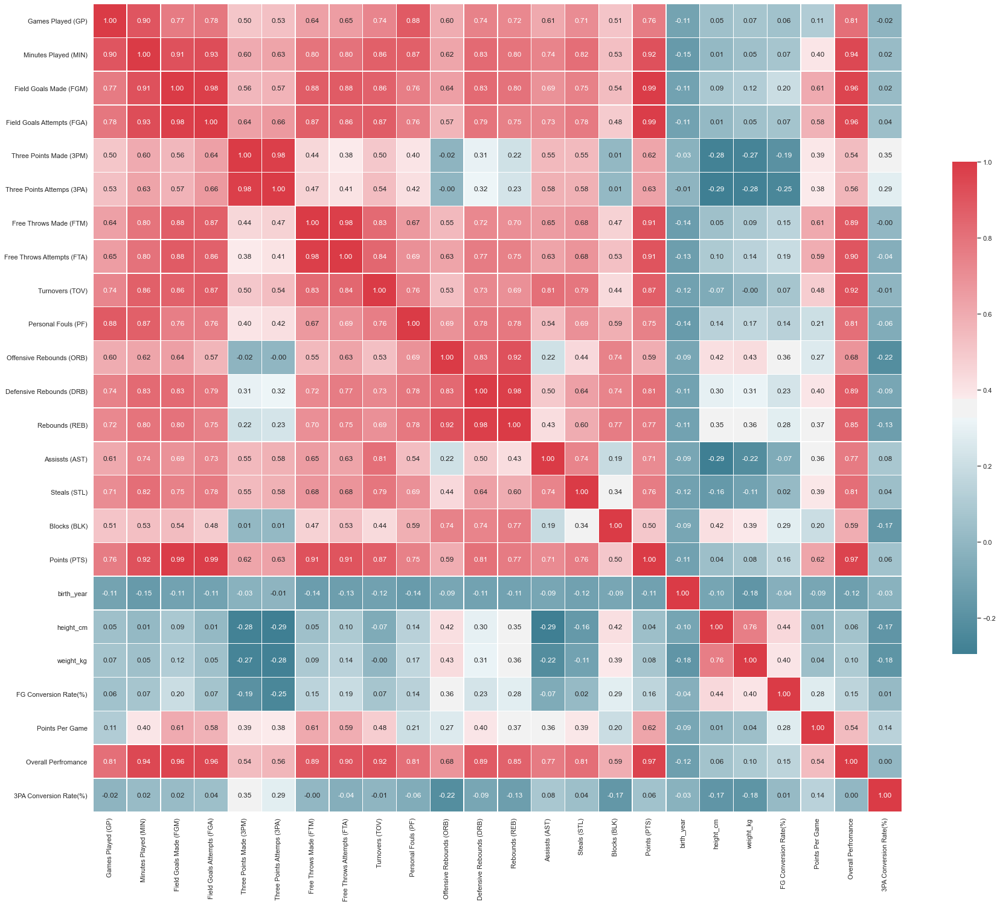

In [22]:
#HEatmap used during the correlation
sns.set(style="white")

players_corr = bb.corr()
# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(30, 30))
# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(players_corr, cmap=cmap,
            square=True, linewidths=.5, cbar_kws={"shrink": .5},annot=True, fmt=".2f")

In [23]:
# selecting rows based on cond
options = ['Michael Jordan']
df = bb.loc[bb['Player'].isin(options)] 

In [24]:
print('Shape:',df.shape)

Shape: (12, 30)


In [25]:
bb_Euro_16_17=bb[(bb['League']=='Euroleague')&(bb['Stage']=='International')&(bb['Season']=='2016 - 2017')]  #slecting rows based on cond

In [26]:
print('Shape:',bb_Euro_16_17.shape)

Shape: (119, 30)


In [27]:
bb_Euro_16_17['Age']=2017-bb_Euro_16_17['birth_year']      #creating new column

<ipython-input-27-c50fb0142b1a>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bb_Euro_16_17['Age']=2017-bb_Euro_16_17['birth_year']      #creating new column


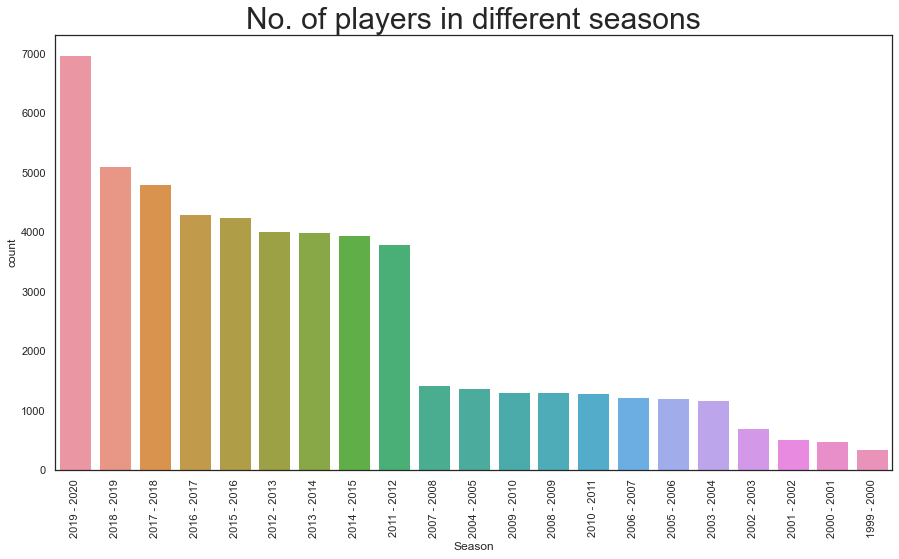

In [28]:
plt.figure(figsize=(15,8))
sns.countplot(bb.Season, order=bb['Season'].value_counts().index)
plt.title('No. of players in different seasons', fontsize = 30, fontweight = 20)
l=plt.xticks(rotation=90)

In [29]:
ds = bb['League'].value_counts().reset_index()
ds.columns = ['League', 'number of samples']
ds = ds.sort_values(['number of samples'])
fig = px.bar(ds, x='number of samples', y="League", orientation='h', title='Leagues presented in dataset', height=1000, width=800
)
fig.show()

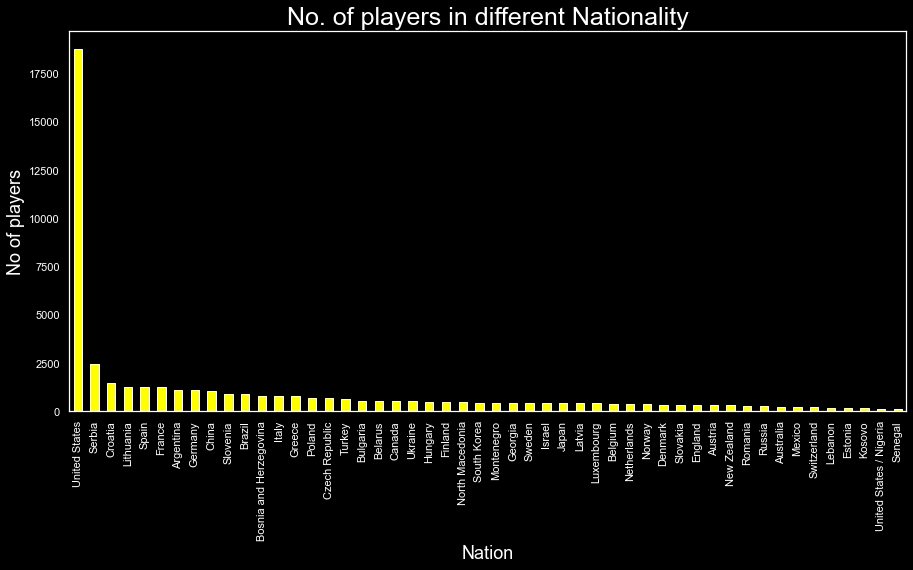

In [30]:
plt.style.use('dark_background')
bb['nationality'].value_counts().head(50).plot.bar(color = 'yellow', figsize = (15, 7))
plt.title('No. of players in different Nationality', fontsize = 25, fontweight = 20)
plt.xlabel('Nation',fontsize = 18)
plt.ylabel('No of players', fontsize = 18)
plt.show()

In [31]:
#Bar Graph,Pie ChartBox Plot,Histogram, Line Chart and Subplots,Scatter Plot

In [32]:
data_nba = bb.iloc[:, 0:22]
data_nba = data_nba.loc[data_nba['League'] == 'NBA', :]
d = data_nba.groupby(['Season', 'Player'], as_index=False)[['Field Goals Made (FGM)', 'Field Goals Attempts (FGA)']].sum().sort_values(by=['Season', 'Field Goals Attempts (FGA)', 'Field Goals Made (FGM)'], ascending=[True, False, False])
dd = d.groupby('Player', as_index=False)[['Field Goals Made (FGM)', 'Field Goals Attempts (FGA)']].mean().sort_values(by='Field Goals Attempts (FGA)', ascending=False)
ddd = dd.reset_index(drop=True)

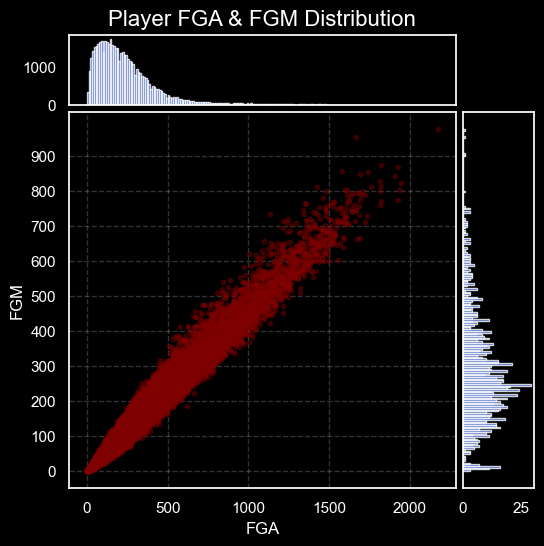

In [33]:
fig = plt.figure(figsize=(6,6), dpi=100)
gs = fig.add_gridspec(6,6)
plt.subplots_adjust(wspace=0.1, hspace=0.1)
ax1 = fig.add_subplot(gs[1:, 0:5])
ax1.set_yticks(np.arange(0, 901, 100))
ax1.grid(alpha=0.2, ls='--')
ax2 = fig.add_subplot(gs[0, 0:5])
ax2.set_xticks([])
ax3 = fig.add_subplot(gs[1:, 5])
ax3.set_yticks([])
ax1.scatter(bb['Field Goals Attempts (FGA)'], bb['Field Goals Made (FGM)'], marker='.', color='maroon', alpha=0.4,)
ax2.hist(bb['Field Goals Made (FGM)'], bins=200, color='royalblue', alpha=0.8)
ax3.hist(ddd['Field Goals Made (FGM)'], bins=200, color='royalblue', alpha=0.8, orientation='horizontal')
ax2.set_title('Player FGA & FGM Distribution', fontsize=16, y=1.02)
ax1.set_xlabel('FGA', fontsize=12)
ax1.set_ylabel('FGM', fontsize=12)
plt.show()

In [34]:
season_19_20=bb[(bb['Season']=='2019 - 2020')]  #slecting rows in season 19-20 only

In [35]:
bb.columns

Index(['League', 'Season', 'Stage', 'Player', 'Team', 'Games Played (GP)',
       'Minutes Played (MIN)', 'Field Goals Made (FGM)',
       'Field Goals Attempts (FGA)', 'Three Points Made (3PM)',
       'Three Points Attemps (3PA)', 'Free Throws Made (FTM)',
       'Free Throws Attempts (FTA)', 'Turnovers (TOV)', 'Personal Fouls (PF)',
       'Offensive Rebounds (ORB)', 'Defensive Rebounds (DRB)',
       'Rebounds (REB)', 'Assissts (AST)', 'Steals (STL)', 'Blocks (BLK)',
       'Points (PTS)', 'birth_year', 'height_cm', 'weight_kg', 'nationality',
       'FG Conversion Rate(%)', 'Points Per Game', 'Overall Perfromance',
       '3PA Conversion Rate(%)'],
      dtype='object')

In [36]:
top_players = season_19_20.sort_values(ascending = False, by = 'Points Per Game')[['Player','Points Per Game']].head(10)

In [37]:
top_players.head(10)

,Player,Points Per Game
41422,Joe Young,38.340909
28440,Dominique Jones,37.785714
31716,Darius Adams,34.896552
50171,Antonio Blakeney,34.750000
31601,James Harden,34.338235
19357,Tyler Hansbrough,32.294118
50382,Shaun Willett,31.545455
25444,Jonathan Gibson,31.222222
41434,Dez Wells,31.090909
43927,Bradley Beal,30.561404


Text(0.5, 1.0, 'Top players ( max point scored)')

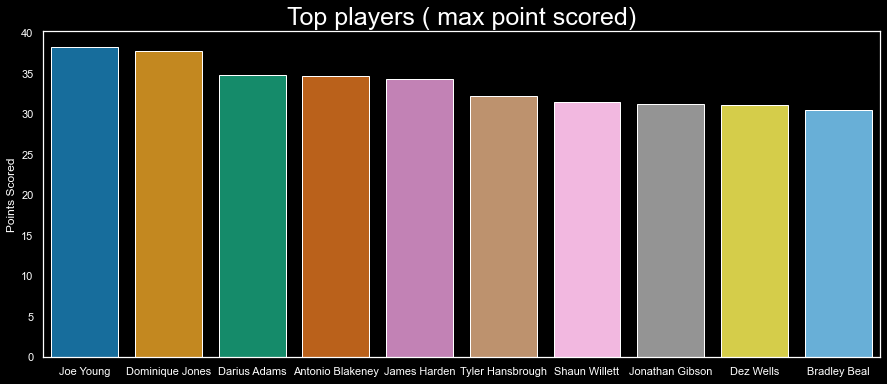

In [38]:
plt.figure(figsize=(15,6))
sd = top_players.sort_values('Points Per Game', ascending=False)[:10]
x1 = np.array(list(top_players['Player']))
y1 = np.array(list(top_players['Points Per Game']))
sns.barplot(x1, y1, palette= "colorblind")
plt.ylabel("Points Scored")
plt.title('Top players ( max point scored)', fontsize = 25, fontweight = 20)


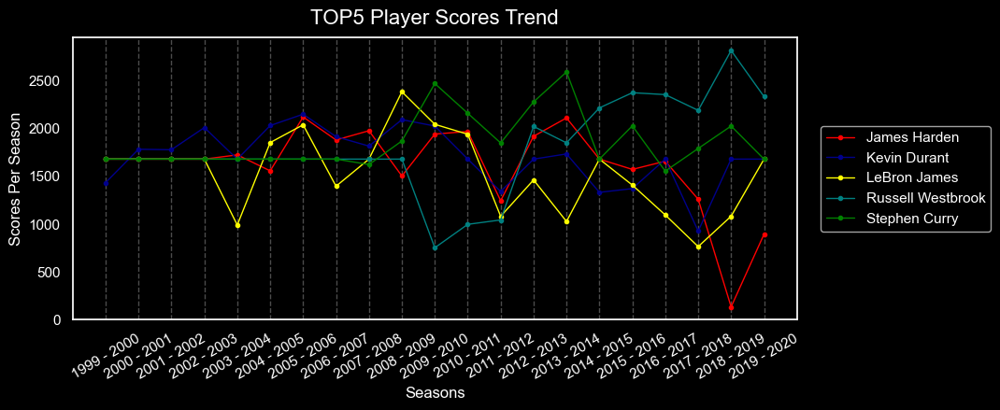

In [39]:
p = data_nba.groupby('Player')['Points (PTS)'].sum().sort_values(ascending=False).head(10)
p1 = data_nba[['Season', 'Stage', 'Player', 'Points (PTS)']].loc[data_nba['Player'].isin(p.index)]
p2 = p1.sort_values(by=['Player', 'Season'], ascending=[True, True]).reset_index(drop=True)
p3 = p2.loc[p2['Stage'] == 'Regular_Season'].reset_index(drop=True)
players = p3[['Season', 'Player', 'Points (PTS)']].set_index(['Season', 'Player']).unstack().T
players = players.fillna(p3['Points (PTS)'].mean())
fig = plt.figure(figsize=(10,4), dpi=100)
ax = fig.add_subplot(111)
ax.plot(players.columns, players.iloc[0].values, label='James Harden', marker='.', lw=1, color='red')
ax.plot(players.columns, players.iloc[1].values, label='Kevin Durant', marker='.', lw=1, color='darkblue')
ax.plot(players.columns, players.iloc[2].values, label='LeBron James', marker='.', lw=1, color='yellow')
ax.plot(players.columns, players.iloc[3].values, label='Russell Westbrook', marker='.', lw=1, color='teal')
ax.plot(players.columns, players.iloc[4].values, label='Stephen Curry', marker='.', lw=1, color='green')
ax.set_xticklabels(players.columns, rotation=30)
ax.set_xlabel('Seasons', fontsize=12)
ax.set_ylabel('Scores Per Season', fontsize=12)
ax.set_title('TOP5 Player Scores Trend', fontsize=16, y=1.02)
ax.xaxis.grid(alpha=0.3, ls='--')
plt.legend(loc='center', bbox_to_anchor=(1,0.5,0.3,0))
plt.show()

In [40]:
#BEST SCORER PER SEASON -
# For Stage = Regular season
scorers = bb[bb['Stage'] == 'Regular_Season']
idx = bb.groupby('Season')['Points Per Game'].transform(max) == bb['Points Per Game']
best_scorers = bb[['Season', 'Player', 'Team', 'Points Per Game','League']][idx]
best_scorers

,Season,Player,Team,Points Per Game,League
1504,1999 - 2000,Shaquille O'Neal,LAL,30.739130,NBA
3070,2004 - 2005,Allen Iverson,PHI,31.200000,NBA
3298,2001 - 2002,Allen Iverson,PHI,31.383333,NBA
6164,2007 - 2008,Kobe Bryant,LAL,30.142857,NBA
6271,2006 - 2007,Kobe Bryant,LAL,32.800000,NBA
6359,2005 - 2006,Kobe Bryant,LAL,35.400000,NBA
7931,2003 - 2004,Tracy McGrady,ORL,28.029851,NBA
8010,2002 - 2003,Tracy McGrady,ORL,32.093333,NBA
8089,2000 - 2001,Tracy McGrady,ORL,33.750000,NBA
13044,2012 - 2013,Andre Emmett,AMC,33.862069,Lebanese-Division-A


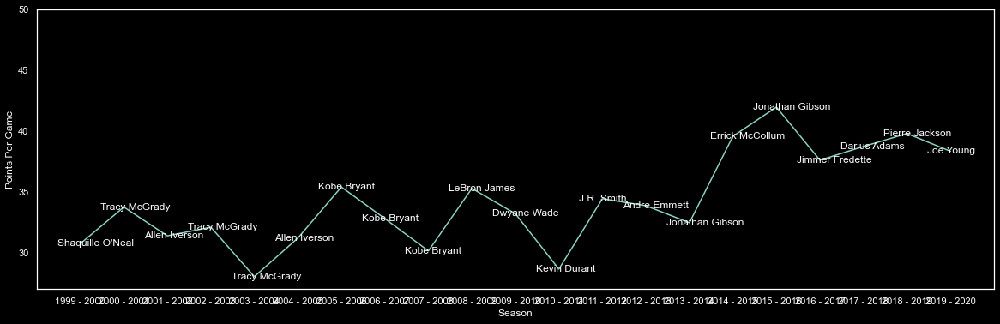

In [41]:
plt.figure(figsize=(20, 6))
ax = sns.lineplot(x="Season", y="Points Per Game", data=best_scorers)
ax.set(ylim=(27, 50))
for index, row in best_scorers.iterrows():
    ax.annotate(row['Player'], (row['Season'], row['Points Per Game'] + 0.5),  xycoords='data', xytext=(-27, -10), textcoords='offset points', size=12)

In [42]:
bb_euro_19_20=bb[(bb['League']=='Euroleague')&(bb['Stage']=='International')&(bb['Season']=='2019 - 2020')]  #slecting rows based on cond
bb_euro_19_20['Age']=2020-bb_euro_19_20['birth_year']      #creating new column

<ipython-input-42-74a022827e81>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [43]:
bb_euro_19_20.columns

Index(['League', 'Season', 'Stage', 'Player', 'Team', 'Games Played (GP)',
       'Minutes Played (MIN)', 'Field Goals Made (FGM)',
       'Field Goals Attempts (FGA)', 'Three Points Made (3PM)',
       'Three Points Attemps (3PA)', 'Free Throws Made (FTM)',
       'Free Throws Attempts (FTA)', 'Turnovers (TOV)', 'Personal Fouls (PF)',
       'Offensive Rebounds (ORB)', 'Defensive Rebounds (DRB)',
       'Rebounds (REB)', 'Assissts (AST)', 'Steals (STL)', 'Blocks (BLK)',
       'Points (PTS)', 'birth_year', 'height_cm', 'weight_kg', 'nationality',
       'FG Conversion Rate(%)', 'Points Per Game', 'Overall Perfromance',
       '3PA Conversion Rate(%)', 'Age'],
      dtype='object')

In [44]:
bb_euro_19_20.head()

,League,Season,Stage,Player,Team,Games Played (GP),Minutes Played (MIN),Field Goals Made (FGM),Field Goals Attempts (FGA),Three Points Made (3PM),...,Points (PTS),birth_year,height_cm,weight_kg,nationality,FG Conversion Rate(%),Points Per Game,Overall Perfromance,3PA Conversion Rate(%),Age
8108,Euroleague,2019 - 2020,International,Luis Scola,MIL,28,537.8,98,216,24,...,258,1980.0,206.0,109.0,Argentina,45.370370,9.214286,364,35.294118,40.0
12162,Euroleague,2019 - 2020,International,Vassilis Spanoulis,OLY,22,542.3,84,205,34,...,248,1982.0,193.0,95.0,Greece,40.975610,11.272727,358,28.571429,38.0
14176,Euroleague,2019 - 2020,International,Jaycee Carroll,RMB,22,294.9,62,141,32,...,166,1983.0,188.0,77.0,United States / Azerbaijan,43.971631,7.545455,158,40.506329,37.0
14177,Euroleague,2019 - 2020,International,Ali Muhammed,FEN,22,319.6,39,92,24,...,120,1983.0,178.0,73.0,United States / Turkey,42.391304,5.454545,168,36.363636,37.0
14178,Euroleague,2019 - 2020,International,Sergei Monia,KHI,17,191.6,11,29,10,...,32,1983.0,203.0,100.0,Russia,37.931034,1.882353,78,43.478261,37.0


In [45]:
bb_euro_19_20
fig = go.Figure()
fig.add_trace(go.Box(y=bb_euro_19_20['Age'],boxmean='sd', # mean and SD visible on plot
                     marker_color="DarkSlateGrey",name="Age"))
fig.update_layout(title="Distribution of Age",title_x=0.5)
fig.show()

NameError: name 'n' is not defined

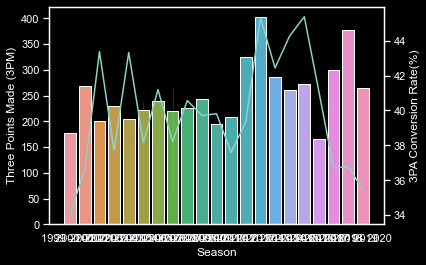

In [46]:
nba = bb[bb.League == 'NBA']
pm3 = nba[['Season', 'Stage', 'Player', 'Team', 'Three Points Made (3PM)', '3PA Conversion Rate(%)']]
# Regular season
pm3 = pm3[pm3['Stage'] == 'Regular_Season']
idx = pm3.groupby('Season')['Three Points Made (3PM)'].transform(max) == pm3['Three Points Made (3PM)']
best_pm = pm3[['Season', 'Player', 'Team', 'Three Points Made (3PM)', '3PA Conversion Rate(%)']][idx]
best_pm
ax = sns.barplot(x="Season", y="Three Points Made (3PM)", data=best_pm)
ax2 = ax.twinx()
ax2 = sns.lineplot(x="Season", y="3PA Conversion Rate(%)", data=best_pm)
for index, row in n.iterrows():
    ax2.annotate(row['Player'].split( )[1] +' ' + str(row['3PA Conversion Rate(%)'])+'%', (row['Season'], row['3PA Conversion Rate(%)']),  xycoords='data', xytext=(-27, -10), textcoords='offset points', size=12)

Text(0.5, 1.0, 'Height vs Point/game')

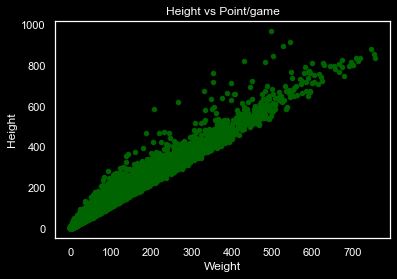

In [47]:
bb.plot(kind='scatter', x='Free Throws Made (FTM)', y='Free Throws Attempts (FTA)',alpha = 1,color = 'darkgreen')
plt.xlabel('Weight')            
plt.ylabel('Height')
plt.title('Height vs Point/game')  

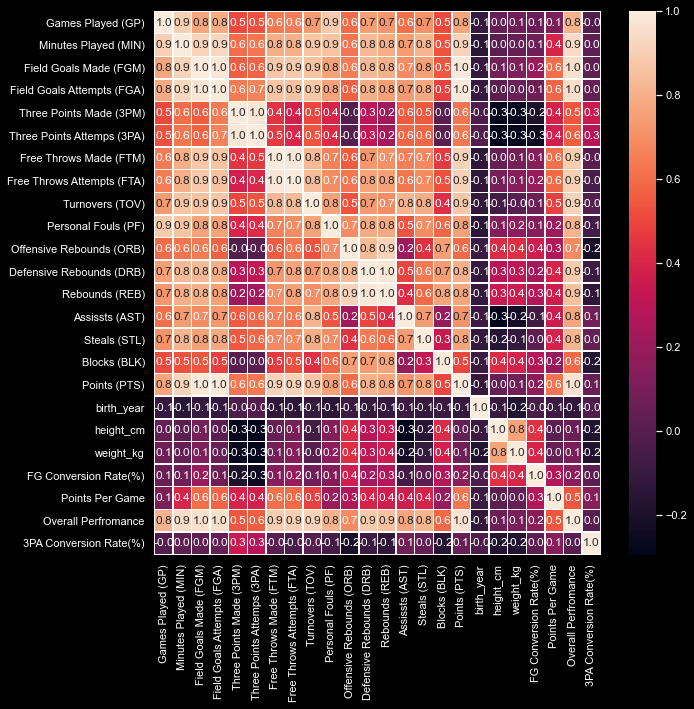

In [48]:
f,ax = plt.subplots(figsize=(10, 10))
sns.heatmap(bb.corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax)
plt.show()

In [49]:
#Normalising the data
from sklearn.preprocessing import normalize

from scipy.spatial.distance import pdist, squareform

In [50]:
bb.select_dtypes(include=np.number).columns.tolist()

['Games Played (GP)',
 'Minutes Played (MIN)',
 'Field Goals Made (FGM)',
 'Field Goals Attempts (FGA)',
 'Three Points Made (3PM)',
 'Three Points Attemps (3PA)',
 'Free Throws Made (FTM)',
 'Free Throws Attempts (FTA)',
 'Turnovers (TOV)',
 'Personal Fouls (PF)',
 'Offensive Rebounds (ORB)',
 'Defensive Rebounds (DRB)',
 'Rebounds (REB)',
 'Assissts (AST)',
 'Steals (STL)',
 'Blocks (BLK)',
 'Points (PTS)',
 'birth_year',
 'height_cm',
 'weight_kg',
 'FG Conversion Rate(%)',
 'Points Per Game',
 'Overall Perfromance',
 '3PA Conversion Rate(%)']

In [51]:
bbnum = bb.select_dtypes(include=np.number).columns.tolist()

In [52]:
print (bbnum)

['Games Played (GP)', 'Minutes Played (MIN)', 'Field Goals Made (FGM)', 'Field Goals Attempts (FGA)', 'Three Points Made (3PM)', 'Three Points Attemps (3PA)', 'Free Throws Made (FTM)', 'Free Throws Attempts (FTA)', 'Turnovers (TOV)', 'Personal Fouls (PF)', 'Offensive Rebounds (ORB)', 'Defensive Rebounds (DRB)', 'Rebounds (REB)', 'Assissts (AST)', 'Steals (STL)', 'Blocks (BLK)', 'Points (PTS)', 'birth_year', 'height_cm', 'weight_kg', 'FG Conversion Rate(%)', 'Points Per Game', 'Overall Perfromance', '3PA Conversion Rate(%)']


In [53]:
norm_bb = pd.DataFrame(normalize(bb[['Games Played (GP)', 'Minutes Played (MIN)', 'Field Goals Made (FGM)', 'Field Goals Attempts (FGA)', 'Three Points Made (3PM)', 'Three Points Attemps (3PA)', 'Free Throws Made (FTM)', 'Free Throws Attempts (FTA)', 'Turnovers (TOV)', 'Personal Fouls (PF)', 'Offensive Rebounds (ORB)', 'Defensive Rebounds (DRB)', 'Rebounds (REB)', 'Assissts (AST)', 'Steals (STL)', 'Blocks (BLK)', 'Points (PTS)', 'birth_year', 'height_cm', 'weight_kg', 'FG Conversion Rate(%)', 'Points Per Game', 'Overall Perfromance', '3PA Conversion Rate(%)']], axis=1, copy=True, return_norm=False))

In [54]:
#Importing libraries 
import matplotlib.pyplot as plt
import pandas as pd
import pylab as pl
import numpy as np
%matplotlib inline

In [55]:
from sklearn import linear_model
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

In [56]:
bbnew=bb.head()

In [59]:
line1 = linear_model.LinearRegression()

In [63]:
df_fgm = bb.loc[:, "Field Goals Made (FGM)"].values.reshape(-1, 1) 
df_pts = bb.loc[:, "Points (PTS)"].values.reshape(-1, 1)

In [64]:
line1.fit(df_fgm, df_pts) 
pred1 = line1.predict(df_fgm)

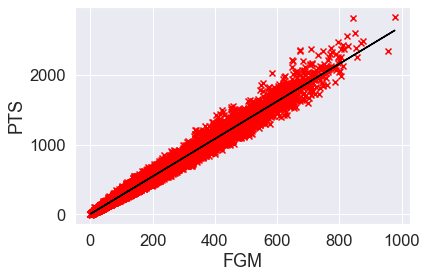

In [200]:
plt.scatter('Field Goals Made (FGM)', 'Points (PTS)', data = bb, marker = 'x', color = 'red')
plt.xlabel("FGM")
plt.ylabel("PTS")
plt.plot(df_fgm,pred1, color='black')
plt.show()

In [68]:
import numpy as np 
import pandas as pd 
import plotly.graph_objects as go
import plotly.express as px
import plotly
import re
import os

In [73]:
#using plotly
fig = go.Figure(
    
    data = go.Scatter(
        x= bb['Points (PTS)'],
        y= bb['Minutes Played (MIN)'],
        mode= 'markers',
        marker = dict(
            size = 10,
            color = bb['birth_year'],
            showscale = True
        ),
        text = bb['Player'])
)
    
fig.update_layout(title=' Scatter Plot ( colored by  birth_year) - Points vs Minutes Played'
                  , xaxis_title = 'Points'
                  , yaxis_title= 'Minutes Played')
fig.show()


In [95]:
bb.mean()

Games Played (GP)               30.410452
Minutes Played (MIN)           755.296246
Field Goals Made (FGM)         113.677291
Field Goals Attempts (FGA)     246.065597
Three Points Made (3PM)         28.559733
Three Points Attemps (3PA)      80.977573
Free Throws Made (FTM)          56.557956
Free Throws Attempts (FTA)      76.354844
Turnovers (TOV)                 47.440323
Personal Fouls (PF)             70.356228
Offensive Rebounds (ORB)        34.470026
Defensive Rebounds (DRB)        90.967866
Rebounds (REB)                 125.437892
Assissts (AST)                  63.041973
Steals (STL)                    26.818473
Blocks (BLK)                    10.538597
Points (PTS)                   312.483231
birth_year                    1986.345398
height_cm                      197.458183
weight_kg                       95.425190
FG Conversion Rate(%)           45.724930
Points Per Game                  9.960452
Overall Perfromance            472.072237
3PA Conversion Rate(%)          31

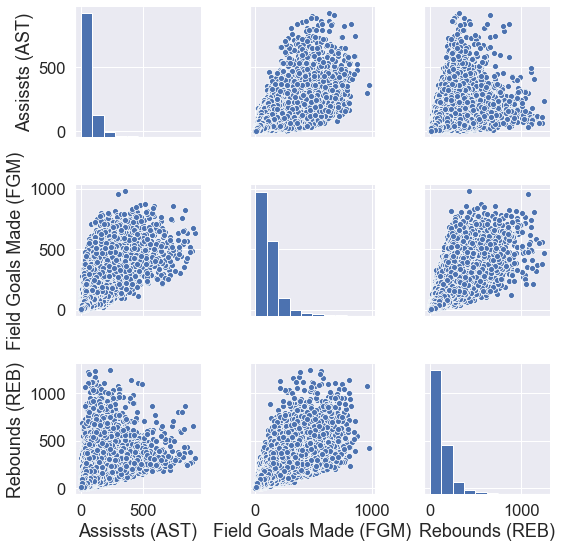

In [201]:
sns.pairplot(bb[["Assissts (AST)", "Field Goals Made (FGM)", "Rebounds (REB)"]])

plt.show()

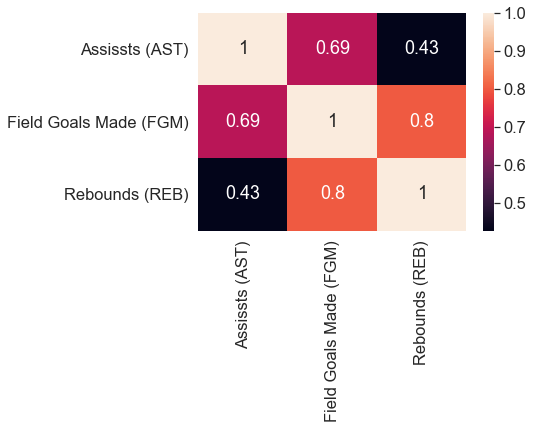

In [199]:
correlation = bb[["Assissts (AST)", "Field Goals Made (FGM)", "Rebounds (REB)"]].corr()
sns.heatmap(correlation, annot=True)

In [98]:
bb.corr() #printing the correlation values 

,Games Played (GP),Minutes Played (MIN),Field Goals Made (FGM),Field Goals Attempts (FGA),Three Points Made (3PM),Three Points Attemps (3PA),Free Throws Made (FTM),Free Throws Attempts (FTA),Turnovers (TOV),Personal Fouls (PF),...,Steals (STL),Blocks (BLK),Points (PTS),birth_year,height_cm,weight_kg,FG Conversion Rate(%),Points Per Game,Overall Perfromance,3PA Conversion Rate(%)
Games Played (GP),1.000000,0.903481,0.768554,0.784373,0.504892,0.526546,0.637006,0.649052,0.735110,0.884798,...,0.707844,0.509944,0.762308,-0.106300,0.045421,0.069323,0.055051,0.113102,0.808616,-0.015142
Minutes Played (MIN),0.903481,1.000000,0.914310,0.930354,0.603676,0.626762,0.795393,0.799338,0.864595,0.867773,...,0.817203,0.532701,0.915429,-0.148421,0.010622,0.045648,0.069626,0.397461,0.944975,0.023717
Field Goals Made (FGM),0.768554,0.914310,1.000000,0.983268,0.558161,0.571873,0.876651,0.879638,0.861184,0.761892,...,0.750714,0.543840,0.991155,-0.108422,0.086099,0.118899,0.200585,0.605128,0.964537,0.023045
Field Goals Attempts (FGA),0.784373,0.930354,0.983268,1.000000,0.636922,0.662931,0.867457,0.859204,0.874351,0.758619,...,0.775875,0.484387,0.985722,-0.110516,0.012765,0.049135,0.068456,0.577506,0.957521,0.041031
Three Points Made (3PM),0.504892,0.603676,0.558161,0.636922,1.000000,0.983659,0.444933,0.381271,0.500115,0.398612,...,0.548621,0.006423,0.621275,-0.029706,-0.277283,-0.267265,-0.194529,0.388024,0.543008,0.349331
Three Points Attemps (3PA),0.526546,0.626762,0.571873,0.662931,0.983659,1.000000,0.465455,0.405767,0.535596,0.419620,...,0.584184,0.012439,0.634021,-0.013941,-0.293751,-0.281243,-0.252160,0.381892,0.564793,0.285781
Free Throws Made (FTM),0.637006,0.795393,0.876651,0.867457,0.444933,0.465455,1.000000,0.983623,0.831626,0.665122,...,0.681229,0.465164,0.914349,-0.136135,0.048271,0.091454,0.149634,0.607287,0.893740,-0.000295
Free Throws Attempts (FTA),0.649052,0.799338,0.879638,0.859204,0.381271,0.405767,0.983623,1.000000,0.838932,0.693965,...,0.681612,0.526986,0.905794,-0.130417,0.096554,0.141766,0.192653,0.591320,0.901771,-0.044623
Turnovers (TOV),0.735110,0.864595,0.861184,0.874351,0.500115,0.535596,0.831626,0.838932,1.000000,0.757987,...,0.788194,0.436266,0.872510,-0.117729,-0.067136,-0.000537,0.070952,0.482868,0.917514,-0.007106
Personal Fouls (PF),0.884798,0.867773,0.761892,0.758619,0.398612,0.419620,0.665122,0.693965,0.757987,1.000000,...,0.694618,0.589754,0.751510,-0.143526,0.139522,0.166248,0.137105,0.207161,0.812231,-0.060761


In [83]:
#Modeling
feature_cols = ['Games Played (GP)', 'Minutes Played (MIN)', 'Field Goals Made (FGM)', 'Field Goals Attempts (FGA)', 'Three Points Made (3PM)']
x = df[feature_cols]
y = df['Points (PTS)']
x.head()

,Games Played (GP),Minutes Played (MIN),Field Goals Made (FGM),Field Goals Attempts (FGA),Three Points Made (3PM)
28,82,3034.0,679,1527,16
4663,19,618.1,61,140,29
4664,28,621.2,53,131,20
4684,19,618.1,61,140,29
4685,28,621.2,53,131,20


In [84]:
from sklearn.model_selection import train_test_split
from sklearn import preprocessing

In [85]:
x_train, x_test, y_train, y_test = train_test_split(x, y , test_size=0.4, random_state=2)

In [86]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(7, 5)
(5, 5)
(7,)
(5,)


In [87]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import numpy as np 
from sklearn import svm
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier

from sklearn import metrics
from sklearn.model_selection import cross_val_score
from sklearn import preprocessing
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier

from sklearn import tree
import warnings
warnings.filterwarnings('ignore')
import pickle

In [88]:
#Knn
#To predict how many points NBA players scored
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(x_train, y_train)
pred = knn.predict(x_test)
print(metrics.accuracy_score(y_test, pred))
print(knn.predict_proba(x_test))

0.0
[[0.  0.2 0.2 0.2 0.4 0. ]
 [0.  0.2 0.2 0.2 0.4 0. ]
 [0.2 0.2 0.2 0.  0.4 0. ]
 [0.2 0.  0.2 0.2 0.4 0. ]
 [0.2 0.2 0.2 0.  0.4 0. ]]


In [89]:
#linear svm

clf = LinearSVC(random_state=2)
clf.fit(x_train, y_train)
print(clf.coef_)
print(clf.intercept_)
pred = (clf.predict(x_test))
#print(pred)
print(metrics.accuracy_score(y_test, pred))

[[ 0.02495305  0.00519781 -0.0215641  -0.01695342 -0.0277576 ]
 [-0.01442776  0.00265278  0.0011221  -0.00593244  0.01357953]
 [-0.01013478  0.00128364  0.00627547 -0.01691647  0.01859294]
 [-0.0078322  -0.00335547 -0.01497817  0.01357692  0.00818027]
 [-0.01102835 -0.00378127  0.02259154 -0.00224493  0.03150992]
 [-0.00018131 -0.00310577  0.00258634  0.00569686 -0.00110866]]
[ 3.92831510e-04  8.53415459e-04 -1.26108282e-03 -9.54151786e-04
 -4.10522881e-04 -3.48131300e-05]
0.2


In [90]:
#random forrest classifier

clf = RandomForestClassifier()
clf.fit(x_train, y_train)

RandomForestClassifier()

In [91]:
print(clf.feature_importances_) #Numpy arrays

[0.20626844 0.19504593 0.22443532 0.1869677  0.18728262]


In [92]:
pred = clf.predict(x_test)
#print(pred)
#print(clf.predict_proba(x_test))
print(metrics.accuracy_score(y_test, pred))

0.8


In [93]:
# Gradient Treee Boosting

clfgtb = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0).fit(x_train, y_train)
clfgtb.score(x_test, y_test)

0.8

In [108]:
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split

In [99]:
#K-Means Clustering
df_nba = bb[(bb['League'] == 'NBA') & (bb['Season'] == '2018 - 2019') & (bb['Stage'] == 'Regular_Season')].reset_index(drop=True)
df_nba.head()

,League,Season,Stage,Player,Team,Games Played (GP),Minutes Played (MIN),Field Goals Made (FGM),Field Goals Attempts (FGA),Three Points Made (3PM),...,Blocks (BLK),Points (PTS),birth_year,height_cm,weight_kg,nationality,FG Conversion Rate(%),Points Per Game,Overall Perfromance,3PA Conversion Rate(%)
0,NBA,2018 - 2019,Regular_Season,Vince Carter,ATL,76,1330.3,196,468,123,...,27,562,1977.0,198.0,100.0,United States,41.880342,7.394737,766,38.924051
1,NBA,2018 - 2019,Regular_Season,Jamal Crawford,PHX,64,1211.0,174,438,67,...,12,508,1980.0,196.0,88.0,United States,39.726027,7.937500,792,33.168317
2,NBA,2018 - 2019,Regular_Season,Kyle Korver,UTA,70,1333.9,201,483,138,...,12,600,1981.0,201.0,96.0,United States,41.614907,8.571429,738,39.655172
3,NBA,2018 - 2019,Regular_Season,Dwyane Wade,MIA,72,1885.3,416,960,86,...,38,1083,1982.0,193.0,100.0,United States,43.333333,15.041667,1516,32.950192
4,NBA,2018 - 2019,Regular_Season,Tony Parker,CHA,56,1002.9,213,463,13,...,7,530,1982.0,188.0,84.0,France,46.004320,9.464286,710,25.490196


In [100]:
#Number of players
print(len(df_nba.Player))
#Columns available
print(df_nba.columns.values)

292
['League' 'Season' 'Stage' 'Player' 'Team' 'Games Played (GP)'
 'Minutes Played (MIN)' 'Field Goals Made (FGM)'
 'Field Goals Attempts (FGA)' 'Three Points Made (3PM)'
 'Three Points Attemps (3PA)' 'Free Throws Made (FTM)'
 'Free Throws Attempts (FTA)' 'Turnovers (TOV)' 'Personal Fouls (PF)'
 'Offensive Rebounds (ORB)' 'Defensive Rebounds (DRB)' 'Rebounds (REB)'
 'Assissts (AST)' 'Steals (STL)' 'Blocks (BLK)' 'Points (PTS)'
 'birth_year' 'height_cm' 'weight_kg' 'nationality'
 'FG Conversion Rate(%)' 'Points Per Game' 'Overall Perfromance'
 '3PA Conversion Rate(%)']


In [101]:
#Columns that we will use to cluster
columns =  ['Player', 'Games Played (GP)', 'Minutes Played (MIN)', 'Field Goals Made (FGM)',
       'Field Goals Attempts (FGA)', 'Three Points Made (3PM)', 'Three Points Attemps (3PA)', 'Free Throws Made (FTM)', 'Free Throws Attempts (FTA)', 'Turnovers (TOV)', 'Personal Fouls (PF)', 'Offensive Rebounds (ORB)', 'Defensive Rebounds (DRB)',
       'Rebounds (REB)', 'Assissts (AST)', 'Steals (STL)', 'Blocks (BLK)', 'Points (PTS)']
df_nba_ = df_nba[columns]

In [102]:
#Some EDA...
#function used to find outliers based in quartiles
def find_outliers(data):
    data = sorted(data)
    Q1, Q3 = np.percentile(data, [25,75])
    IQR = Q3-Q1
    lower_bound = Q1 -(1.5 * IQR) 
    upper_bound = Q3 +(1.5 * IQR)
    return lower_bound, upper_bound

gp_lower, gp_upper = find_outliers(df_nba_['Games Played (GP)'])
gp_lower

41.625

In [103]:
bb_filt = df_nba_[df_nba_['Games Played (GP)'] > gp_lower]
len(bb_filt['Player'])

278

In [104]:
#df that will be used in model
#contains only stats and name of the player
bb_p = bb_filt[np.append(bb_filt.columns.values[0], (bb_filt.columns.values[3:]))].reset_index(drop=True)
bb_p.head()

,Player,Field Goals Made (FGM),Field Goals Attempts (FGA),Three Points Made (3PM),Three Points Attemps (3PA),Free Throws Made (FTM),Free Throws Attempts (FTA),Turnovers (TOV),Personal Fouls (PF),Offensive Rebounds (ORB),Defensive Rebounds (DRB),Rebounds (REB),Assissts (AST),Steals (STL),Blocks (BLK),Points (PTS)
0,Vince Carter,196,468,123,316,47,66,48,141,31,163,194,87,44,27,562
1,Jamal Crawford,174,438,67,202,93,110,99,75,8,77,85,229,33,12,508
2,Kyle Korver,201,483,138,348,60,73,59,106,9,153,162,81,25,12,600
3,Dwyane Wade,416,960,86,261,165,233,166,118,69,216,285,301,59,38,1083
4,Tony Parker,213,463,13,51,91,124,75,53,14,69,83,207,21,7,530


In [106]:
X = bb_p[int_cols]

In [107]:
#Then, I will rescale the data with StandardScaler.
from sklearn import preprocessing
sc = preprocessing.StandardScaler()
X_std = sc.fit_transform(X)
X_std

array([[-0.69721259, -0.5694994 ,  0.59714892, ..., -0.40022424,
        -0.29421812, -0.60571648],
       [-0.83191965, -0.65667408, -0.2619597 , ..., -0.7681995 ,
        -0.74494903, -0.72364219],
       [-0.66659734, -0.52591206,  0.8272673 , ..., -1.03581787,
        -0.74494903, -0.52273172],
       ...,
       [ 0.28247517,  0.12208636, -0.82958504, ..., -0.7681995 ,
         0.66734117,  0.18263874],
       [-0.07266164, -0.21789488, -0.50741931, ..., -0.13260587,
         1.3584619 , -0.09033744],
       [-0.79518136, -0.85136418, -1.19777445, ..., -1.00236557,
         0.63729244, -0.83938409]])

In [109]:
kmeans = KMeans(n_clusters=5, random_state=0)
kmeans.fit(X_std)

KMeans(n_clusters=5, random_state=0)

In [110]:
bb_p['cluster'] = kmeans.predict(X_std)
bb_p.head()

,Player,Field Goals Made (FGM),Field Goals Attempts (FGA),Three Points Made (3PM),Three Points Attemps (3PA),Free Throws Made (FTM),Free Throws Attempts (FTA),Turnovers (TOV),Personal Fouls (PF),Offensive Rebounds (ORB),Defensive Rebounds (DRB),Rebounds (REB),Assissts (AST),Steals (STL),Blocks (BLK),Points (PTS),cluster
0,Vince Carter,196,468,123,316,47,66,48,141,31,163,194,87,44,27,562,1
1,Jamal Crawford,174,438,67,202,93,110,99,75,8,77,85,229,33,12,508,1
2,Kyle Korver,201,483,138,348,60,73,59,106,9,153,162,81,25,12,600,1
3,Dwyane Wade,416,960,86,261,165,233,166,118,69,216,285,301,59,38,1083,3
4,Tony Parker,213,463,13,51,91,124,75,53,14,69,83,207,21,7,530,1


Text(0.5, 1.0, 'Stats by cluster')

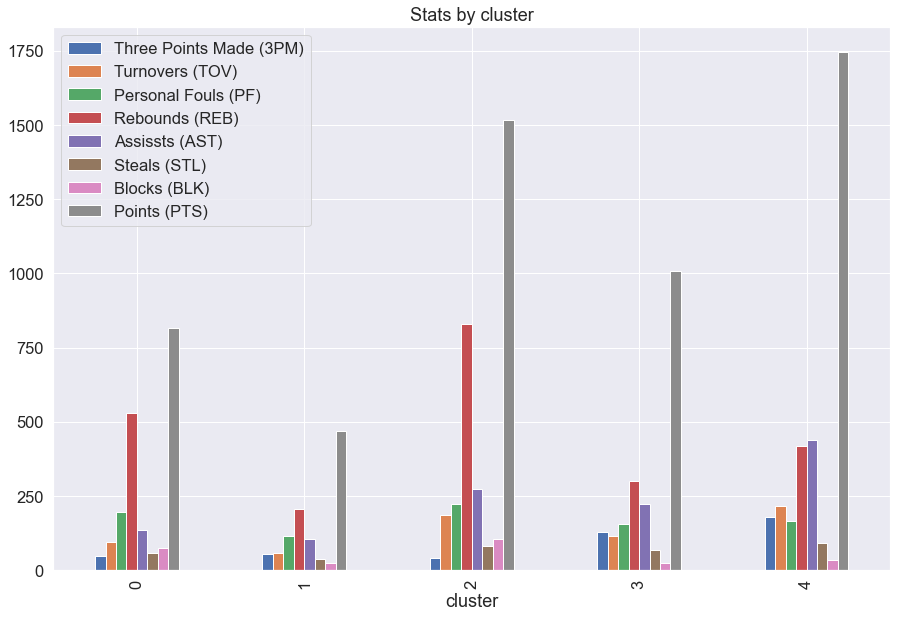

In [111]:
data_plot = bb_p[['Three Points Made (3PM)', 'Turnovers (TOV)', 'Personal Fouls (PF)','Rebounds (REB)', 'Assissts (AST)', 'Steals (STL)', 'Blocks (BLK)', 'Points (PTS)', 'cluster']]
data_plot.groupby("cluster").aggregate("mean").plot.bar(figsize=(15,10))
plt.title("Stats by cluster")

In [135]:
#Linear Regression Model
df_bb1 = bb[['Player','birth_year','Points (PTS)','Field Goals Made (FGM)', 'Assissts (AST)', 'Free Throws Made (FTM)']]

In [136]:
df_bb1.shape

(53463, 6)

In [138]:
df_bb1['Assissts (AST)'] = df_bb1['Assissts (AST)']/1000000
df_bb1['Free Throws Made (FTM)'] = df_bb1['Free Throws Made (FTM)']/10000

In [139]:
df_bb1.corr()

,birth_year,Points (PTS),Field Goals Made (FGM),Assissts (AST),Free Throws Made (FTM)
birth_year,1.000000,-0.112890,-0.108422,-0.090449,-0.136135
Points (PTS),-0.112890,1.000000,0.991155,0.711805,0.914349
Field Goals Made (FGM),-0.108422,0.991155,1.000000,0.687649,0.876651
Assissts (AST),-0.090449,0.711805,0.687649,1.000000,0.654508
Free Throws Made (FTM),-0.136135,0.914349,0.876651,0.654508,1.000000


In [140]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(bb[['Field Goals Made (FGM)']], bb[['Assissts (AST)']], test_size=0.2, random_state=42)

In [141]:
#Create the Linear Regression Model
from sklearn.linear_model import LinearRegression
lr = LinearRegression() # Create the model
lr.fit(x_train, y_train) #Train the model
predictions = lr.predict(x_test) #Make predictions on the test data
print(predictions)
print(y_test)

[[ 60.08253452]
 [268.18655203]
 [ 66.08553502]
 ...
 [  8.55678018]
 [ 61.0830346 ]
 [ 66.58578506]]
       Assissts (AST)
24182              32
2522              403
4164               72
18530              51
8871               68
...               ...
10988              24
50516               6
53086               6
37830              33
27884              40

[10693 rows x 1 columns]


In [142]:
lr_confidence = lr.score(x_test, y_test)
print("lr confidence (R^2): ", lr_confidence)


from sklearn.metrics import mean_squared_error
print("Mean Squared Error (MSE): ",mean_squared_error(y_test, predictions))

lr confidence (R^2):  0.47089420808990157
Mean Squared Error (MSE):  2883.8833014006273


In [144]:
import numpy as np
split = np.random.rand(len(df_bb1)) < 0.875
train = bb[split]
test = bb[~split]

In [145]:
from sklearn import linear_model
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

In [146]:
regr = linear_model.LinearRegression()

In [147]:
## Trainig & fitting the model
bb_x_train = train[['birth_year','Field Goals Made (FGM)','Free Throws Made (FTM)','Assissts (AST)']]
bb_y_train = train[['Points (PTS)']]
poly = PolynomialFeatures(degree=4)
bb_x_train_poly = poly.fit_transform(bb_x_train)
regr.fit(bb_x_train_poly, bb_y_train)

LinearRegression()

In [148]:
## Testing the model
bb_x_test = test[['birth_year','Field Goals Made (FGM)','Free Throws Made (FTM)','Assissts (AST)']]
bb_y_test = test[['Points (PTS)']]
bb_x_test_poly = poly.fit_transform(bb_x_test)

In [149]:
df_bb_pred = regr.predict(bb_x_test_poly)

In [150]:
r2_score(bb_y_test, df_bb_pred)

0.9932071702773869

In [151]:
bb_x_test['Predicted Ratings'] = df_bb_pred

In [152]:
df_bb2 = pd.merge(df_bb1,bb_x_test)
df_bb2.head(20)

,Player,birth_year,Points (PTS),Field Goals Made (FGM),Assissts (AST),Free Throws Made (FTM),Predicted Ratings
0,Mike Miller,1980.0,9,3,0.0,0.0,6.030941
1,Tarek Ammoury,1990.0,6,2,0.0,0.0,2.731551
2,Alexandru Bratosin,2003.0,0,0,0.0,0.0,1.270055


In [153]:
df_bb_pred2 = regr.predict(bb_x_train_poly)
bb_x_train['Predicted Ratings'] = df_bb_pred2

In [154]:
df_bb3 = pd.merge(df_bb1,bb_x_train)
df_bb3.head(20)

,Player,birth_year,Points (PTS),Field Goals Made (FGM),Assissts (AST),Free Throws Made (FTM),Predicted Ratings
0,Jason Collins,1978.0,12,6,0.0,0.0,13.233330
1,Jake Tsakalidis,1979.0,12,6,0.0,0.0,13.144966
2,Joel Anthony,1982.0,6,3,0.0,0.0,5.779595
3,Ivan Drzic,1983.0,0,0,0.0,0.0,-1.436720
4,Steve Novak,1983.0,12,4,0.0,0.0,8.017047
5,Chris Cayole,1985.0,3,1,0.0,0.0,0.688186
6,Martin Miklosik,1986.0,0,0,0.0,0.0,-1.790147
7,Martin Miklosik,1986.0,0,0,0.0,0.0,-1.790147
8,Martin Miklosik,1986.0,0,0,0.0,0.0,-1.790147
9,Julien Barrat,1986.0,0,0,0.0,0.0,-1.790147


In [161]:
#Using NBA till 2017, Prediction of NBA 2018-2019 Players and their ratings
bb_n = bb [bb ['Season'] == '2018 - 2019']
print (bb_n)

                                   League       Season          Stage  \
625                      Japanese-BLeague  2018 - 2019  International   
1512                          British-BBL  2018 - 2019  International   
2626                        Brazilian-NBB  2018 - 2019  International   
2627                     South-Korean-KBL  2018 - 2019  International   
3419                   Argentinian-Liga-A  2018 - 2019  International   
...                                   ...          ...            ...   
53434                      Belarusian-BPL  2018 - 2019  International   
53435                      Belarusian-BPL  2018 - 2019  International   
53436                      Belarusian-BPL  2018 - 2019  International   
53437  Estonian-Latvian-Basketball-League  2018 - 2019  International   
53438                          Kosovo-FBK  2018 - 2019  International   

                   Player  Team  Games Played (GP)  Minutes Played (MIN)  \
625        Takehiko Orimo   LEV                

In [170]:
df_bb4 = bb_n[['birth_year','Field Goals Made (FGM)','Free Throws Made (FTM)','Assissts (AST)', 'Points (PTS)']]

In [171]:
df_bb4['Assissts (AST)'] = df_bb4['Assissts (AST)']/1000000
df_bb4['Free Throws Made (FTM)'] = df_bb4['Free Throws Made (FTM)']/10000

In [172]:
df_bb4.head()

,birth_year,Field Goals Made (FGM),Free Throws Made (FTM),Assissts (AST),Points (PTS)
625,1970.0,136,0.0057,0.000051,380
1512,1973.0,24,0.0009,0.000073,61
2626,1975.0,66,0.0052,0.000041,222
2627,1975.0,112,0.0037,0.000067,317
3419,1976.0,226,0.0137,0.000050,657


In [173]:
df_bb4.shape

(5104, 5)

In [174]:
df_bb4.corr()

,birth_year,Field Goals Made (FGM),Free Throws Made (FTM),Assissts (AST),Points (PTS)
birth_year,1.000000,-0.059274,-0.059028,-0.081727,-0.066627
Field Goals Made (FGM),-0.059274,1.000000,0.860735,0.678500,0.990252
Free Throws Made (FTM),-0.059028,0.860735,1.000000,0.643527,0.901005
Assissts (AST),-0.081727,0.678500,0.643527,1.000000,0.705601
Points (PTS),-0.066627,0.990252,0.901005,0.705601,1.000000


In [175]:
import numpy as np
split = np.random.rand(len(df_bb4)) < 0.75
train2 = df_bb4[split]
test2 = df_bb4[~split]

In [176]:
regr2 = linear_model.LinearRegression()

In [177]:
## Trainig & fitting the model
bb_x_train2 = train2[['birth_year','Field Goals Made (FGM)','Free Throws Made (FTM)','Assissts (AST)']]
bb_y_train2 = train2[['Points (PTS)']]
poly = PolynomialFeatures(degree=4)
bb_x_train_poly2 = poly.fit_transform(bb_x_train2)
regr2.fit(bb_x_train_poly2, bb_y_train2)

LinearRegression()

In [178]:
## Testing the model
bb_x_test2 = test2[['birth_year','Field Goals Made (FGM)','Free Throws Made (FTM)','Assissts (AST)']]
bb_y_test2 = test2[['Points (PTS)']]
bb_x_test_poly2 = poly.fit_transform(bb_x_test2)

In [179]:
df_bb_pred2 = regr2.predict(bb_x_test_poly2)

In [180]:
r2_score(bb_y_test2, df_bb_pred2)

0.9910372877113843

In [181]:
bb_x_test2['Predicted Ratings'] = df_bb_pred2

In [182]:
df_bb5 = pd.merge(df_bb4,bb_x_test2)
df_bb5.head(20)

,birth_year,Field Goals Made (FGM),Free Throws Made (FTM),Assissts (AST),Points (PTS),Predicted Ratings
0,1970.0,136,0.0057,0.000051,380,352.293261
1,1976.0,226,0.0137,0.000050,657,609.167736
2,1976.0,136,0.0040,0.000115,363,368.921228
3,1979.0,103,0.0058,0.000034,296,287.464225
4,1979.0,50,0.0045,0.000040,151,159.289978
5,1979.0,39,0.0031,0.000051,135,123.764725
6,1980.0,174,0.0093,0.000229,508,514.208488
7,1980.0,139,0.0060,0.000043,338,371.816301
8,1980.0,139,0.0060,0.000043,338,371.816301
9,1980.0,80,0.0052,0.000061,244,239.024379


In [183]:
df_bb_pred3 = regr2.predict(bb_x_train_poly2)

In [185]:
bb_x_train2['Predicted Ratings'] = df_bb_pred3

In [186]:
df_bb6 = pd.merge(df_bb4,bb_x_train2)
df_bb6.head(20)

,birth_year,Field Goals Made (FGM),Free Throws Made (FTM),Assissts (AST),Points (PTS),Predicted Ratings
0,1973.0,24,0.0009,0.000073,61,62.771820
1,1975.0,66,0.0052,0.000041,222,198.090687
2,1975.0,112,0.0037,0.000067,317,299.425649
3,1976.0,276,0.0124,0.000268,680,758.828469
4,1977.0,196,0.0047,0.000087,562,498.668758
5,1978.0,36,0.0026,0.000093,114,118.118151
6,1978.0,88,0.0045,0.000069,250,252.650934
7,1978.0,44,0.0024,0.000106,147,136.999341
8,1978.0,270,0.0089,0.000094,676,677.754253
9,1979.0,186,0.0113,0.000123,550,541.477581


In [187]:
df_bb7 = df_bb1[['birth_year','Field Goals Made (FGM)','Free Throws Made (FTM)','Assissts (AST)']]
df_bb8 = poly.fit_transform(df_bb7)

In [188]:
df_bb_pred4 = regr2.predict(df_bb8)

In [189]:
df_bb7['NBA 2018-2019 Predicted Ratings'] = df_bb_pred4

In [190]:
df_bb7.head()

,birth_year,Field Goals Made (FGM),Free Throws Made (FTM),Assissts (AST),NBA 2018-2019 Predicted Ratings
0,1961.0,184,0.0080,0.000068,423.894591
1,1961.0,34,0.0019,0.000010,24.264916
2,1962.0,309,0.0237,0.000629,791.731041
3,1962.0,123,0.0051,0.000024,276.211436
4,1962.0,18,0.0020,0.000026,-7.316595


In [191]:
df_bb9 = pd.merge(df_bb1,df_bb7)

In [192]:
df_bb9.head(20)

,Player,birth_year,Points (PTS),Field Goals Made (FGM),Assissts (AST),Free Throws Made (FTM),NBA 2018-2019 Predicted Ratings
0,Sam Perkins,1961.0,537,184,0.000068,0.0080,423.894591
1,Sam Perkins,1961.0,110,34,0.000010,0.0019,24.264916
2,John Stockton,1962.0,884,309,0.000629,0.0237,791.731041
3,Kevin Willis,1962.0,297,123,0.000024,0.0051,276.211436
4,John Stockton,1962.0,56,18,0.000026,0.0020,-7.316595
5,Kevin Willis,1962.0,46,21,0.000002,0.0003,-19.012060
6,John Stockton,1962.0,1102,401,0.000674,0.0275,884.602466
7,John Stockton,1962.0,50,18,0.000040,0.0012,-10.084624
8,Patrick Ewing,1962.0,26,8,0.000004,0.0010,-50.985091
9,John Stockton,1962.0,944,328,0.000713,0.0227,752.409222


In [193]:
## The predicted top 19 for NBA 2018-2019 basketballers with their ratings
df_bb9 = df_bb9.sort_values('NBA 2018-2019 Predicted Ratings', ascending = False).reset_index()
df_bb9.drop("index", axis = 1, inplace = True)
df_bb9.head(20)

,Player,birth_year,Points (PTS),Field Goals Made (FGM),Assissts (AST),Free Throws Made (FTM),NBA 2018-2019 Predicted Ratings
0,James Harden,1989.0,2818,843,0.000586,0.0754,2812.479307
1,Kevin Durant,1988.0,2593,849,0.000445,0.0703,2693.049206
2,Russell Westbrook,1988.0,2558,824,0.000840,0.0710,2653.114037
3,LeBron James,1984.0,2478,875,0.000521,0.0601,2530.837055
4,Kevin Durant,1988.0,2472,794,0.000231,0.0756,2503.859761
5,Kobe Bryant,1978.0,2832,978,0.000360,0.0696,2487.041664
6,Dwyane Wade,1982.0,2386,854,0.000589,0.0590,2418.551822
7,James Harden,1989.0,2376,710,0.000612,0.0720,2396.816227
8,LeBron James,1984.0,2304,789,0.000587,0.0594,2374.068327
9,Kevin Durant,1988.0,2280,731,0.000374,0.0679,2357.169982


In [194]:
r2_score(df_bb9['Points (PTS)'], df_bb9['NBA 2018-2019 Predicted Ratings'])

0.986627825370004

In [195]:
from scipy import stats

pearson_coef, p_value = stats.pearsonr(df_bb9['Points (PTS)'], df_bb9['NBA 2018-2019 Predicted Ratings'])
print("Pearson Correlation Coefficient: ", pearson_coef, "and a P-value of:", p_value)

Pearson Correlation Coefficient:  0.993418638300121 and a P-value of: 0.0
